In [4]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/datasets/badasstechie/celebahq-resized-256x256/celeba_hq_256/08450.jpg
/kaggle/input/datasets/badasstechie/celebahq-resized-256x256/celeba_hq_256/19812.jpg
/kaggle/input/datasets/badasstechie/celebahq-resized-256x256/celeba_hq_256/22735.jpg
/kaggle/input/datasets/badasstechie/celebahq-resized-256x256/celeba_hq_256/16916.jpg
/kaggle/input/datasets/badasstechie/celebahq-resized-256x256/celeba_hq_256/05938.jpg
/kaggle/input/datasets/badasstechie/celebahq-resized-256x256/celeba_hq_256/06122.jpg
/kaggle/input/datasets/badasstechie/celebahq-resized-256x256/celeba_hq_256/08536.jpg
/kaggle/input/datasets/badasstechie/celebahq-resized-256x256/celeba_hq_256/22706.jpg
/kaggle/input/datasets/badasstechie/celebahq-resized-256x256/celeba_hq_256/20513.jpg
/kaggle/input/datasets/badasstechie/celebahq-resized-256x256/celeba_hq_256/12666.jpg
/kaggle/input/datasets/badasstechie/celebahq-resized-256x256/celeba_hq_256/04168.jpg
/kaggle/input/datasets/badasstechie/celebahq-resized-256x256/cele

In [5]:
import os
import torch

print("CUDA available:", torch.cuda.is_available())
print("GPU count:", torch.cuda.device_count())
if torch.cuda.is_available():
    for i in range(torch.cuda.device_count()):
        print(f"GPU {i}: {torch.cuda.get_device_name(i)}")

# Correct path
base = "/kaggle/input/datasets/badasstechie/celebahq-resized-256x256/celeba_hq_256"
all_imgs = sorted([f for f in os.listdir(base) if f.endswith('.jpg') or f.endswith('.png')])

print(f"\nTotal images : {len(all_imgs)}")
print(f"Sample files : {all_imgs[:5]}")
print(f"Image path   : {base}")

CUDA available: True
GPU count: 2
GPU 0: Tesla T4
GPU 1: Tesla T4

Total images : 30000
Sample files : ['00000.jpg', '00001.jpg', '00002.jpg', '00003.jpg', '00004.jpg']
Image path   : /kaggle/input/datasets/badasstechie/celebahq-resized-256x256/celeba_hq_256


# Diffusion Model from Scratch on CelebA-HQ 256×256

## What we build in this notebook
A complete diffusion model pipeline from first principles, covering 4 progressive concepts:

| Part | Concept | Paper |
|------|---------|-------|
| 1 | DDPM — Denoising Diffusion Probabilistic Models | Ho et al. 2020 |
| 2 | DDIM — Fast sampling in 50 steps instead of 1000 | Song et al. 2020 |
| 3 | Score Matching + Noise Conditioning | Song et al. 2021 |
| 4 | Classifier-Free Guidance (core of Stable Diffusion) | Ho & Salimans 2022 |

## Why diffusion over VAE?
VAEs use MSE reconstruction loss which averages over all plausible outputs → blurry images.
Diffusion models learn the full data distribution iteratively → sharp, photorealistic outputs.

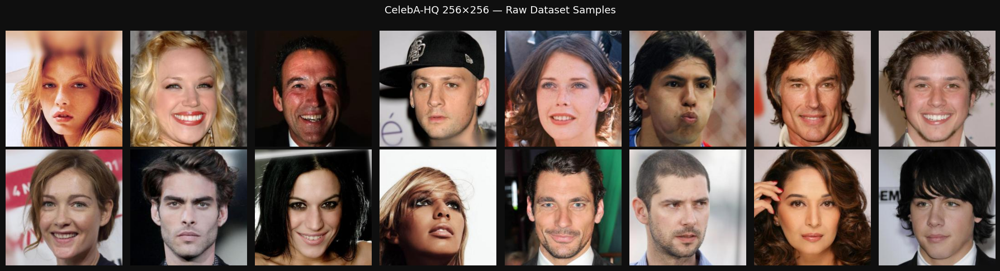

Image size   : (256, 256)
Total images : 30000
Mode         : RGB


In [6]:
import matplotlib.pyplot as plt
from PIL import Image
import random
import os

IMG_DIR = "/kaggle/input/datasets/badasstechie/celebahq-resized-256x256/celeba_hq_256"
all_imgs = sorted(os.listdir(IMG_DIR))

fig, axes = plt.subplots(2, 8, figsize=(18, 5))
fig.patch.set_facecolor('#0f0f0f')
sample = random.sample(all_imgs, 16)

for i, ax in enumerate(axes.flatten()):
    img = Image.open(os.path.join(IMG_DIR, sample[i]))
    ax.imshow(img)
    ax.axis('off')

plt.suptitle('CelebA-HQ 256×256 — Raw Dataset Samples', color='white', fontsize=13)
plt.tight_layout()
plt.savefig('dataset_samples.png', dpi=120, bbox_inches='tight', facecolor='#0f0f0f')
plt.show()

img = Image.open(os.path.join(IMG_DIR, all_imgs[0]))
print(f"Image size   : {img.size}")
print(f"Total images : {len(all_imgs)}")
print(f"Mode         : {img.mode}")

## Part 1: The Forward Noising Process
The core idea of diffusion: gradually destroy an image by adding Gaussian noise over T=1000 timesteps.

**Forward process:** q(x_t | x_{t-1}) = N(x_t; √(1-β_t) * x_{t-1}, β_t * I)

The magic trick: we can jump directly to any timestep t without iterating step by step:
**q(x_t | x_0) = N(x_t; √ᾱ_t * x_0, (1-ᾱ_t) * I)**

Where ᾱ_t = cumulative product of (1-β) from 1 to t.
This means: x_t = √ᾱ_t * x_0 + √(1-ᾱ_t) * ε, where ε ~ N(0,I)

The model's job: learn to reverse this process — predict ε from x_t.

Noise Schedule (Linear):
  T             : 1000 timesteps
  β range       : 0.0001 → 0.02
  ᾱ at t=0      : 0.9999  (almost pure image)
  ᾱ at t=500    : 0.0786 (half noisy)
  ᾱ at t=999    : 0.000040 (almost pure noise)


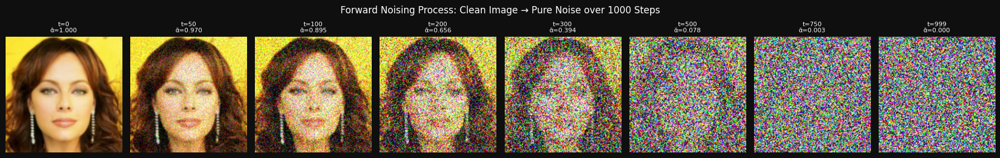

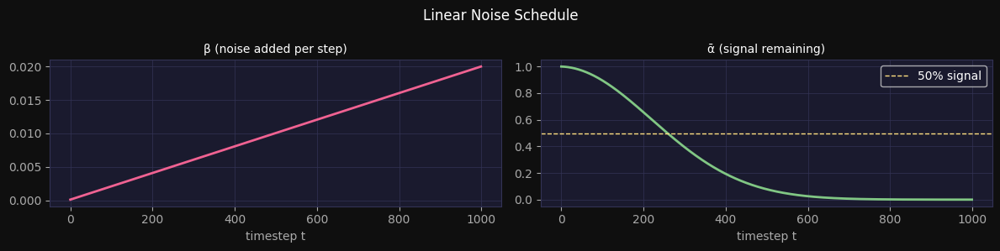

In [7]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms

# ── Noise Schedule ──────────────────────────────────────────────
T          = 1000
beta_start = 1e-4
beta_end   = 0.02

# Linear schedule: beta increases from small to large over T steps
betas      = torch.linspace(beta_start, beta_end, T)
alphas     = 1.0 - betas
alpha_bars = torch.cumprod(alphas, dim=0)   # ᾱ_t

print("Noise Schedule (Linear):")
print(f"  T             : {T} timesteps")
print(f"  β range       : {beta_start} → {beta_end}")
print(f"  ᾱ at t=0      : {alpha_bars[0]:.4f}  (almost pure image)")
print(f"  ᾱ at t=500    : {alpha_bars[499]:.4f} (half noisy)")
print(f"  ᾱ at t=999    : {alpha_bars[999]:.6f} (almost pure noise)")

# ── Forward process: q(x_t | x_0) ───────────────────────────────
def forward_noising(x0, t, alpha_bars):
    """Add noise directly to timestep t in one shot."""
    sqrt_ab   = alpha_bars[t].sqrt().view(-1,1,1,1)
    sqrt_1mab = (1 - alpha_bars[t]).sqrt().view(-1,1,1,1)
    eps       = torch.randn_like(x0)
    x_t       = sqrt_ab * x0 + sqrt_1mab * eps
    return x_t, eps

# ── Visualize noising at different timesteps ─────────────────────
transform = transforms.Compose([
    transforms.Resize(128),
    transforms.CenterCrop(128),
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
])

img_path = os.path.join(IMG_DIR, all_imgs[42])
x0 = transform(Image.open(img_path)).unsqueeze(0)

timesteps  = [0, 50, 100, 200, 300, 500, 750, 999]
fig, axes  = plt.subplots(1, len(timesteps), figsize=(18, 3))
fig.patch.set_facecolor('#0f0f0f')

for ax, t in zip(axes, timesteps):
    t_tensor = torch.tensor([t])
    if t == 0:
        xt = x0
    else:
        xt, _ = forward_noising(x0, t_tensor, alpha_bars)

    img_show = (xt.squeeze(0).permute(1,2,0) * 0.5 + 0.5).clamp(0,1).numpy()
    ax.imshow(img_show)
    ax.set_title(f't={t}\nᾱ={alpha_bars[t]:.3f}', color='white', fontsize=8)
    ax.axis('off')

plt.suptitle('Forward Noising Process: Clean Image → Pure Noise over 1000 Steps',
    color='white', fontsize=12)
plt.tight_layout()
plt.savefig('forward_noising.png', dpi=130, bbox_inches='tight', facecolor='#0f0f0f')
plt.show()

# ── Plot alpha_bar curve ─────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(12, 3))
fig.patch.set_facecolor('#0f0f0f')

for ax in axes:
    ax.set_facecolor('#1a1a2e')
    ax.tick_params(colors='#aaaaaa')
    for sp in ax.spines.values(): sp.set_edgecolor('#333355')
    ax.grid(True, color='#333355', linewidth=0.5)

axes[0].plot(betas.numpy(), color='#f06292', linewidth=2)
axes[0].set_title('β (noise added per step)', color='white', fontsize=10)
axes[0].set_xlabel('timestep t', color='#aaaaaa')

axes[1].plot(alpha_bars.numpy(), color='#81c784', linewidth=2)
axes[1].set_title('ᾱ (signal remaining)', color='white', fontsize=10)
axes[1].set_xlabel('timestep t', color='#aaaaaa')
axes[1].axhline(y=0.5, color='#ffe082', linewidth=1, linestyle='--', label='50% signal')
axes[1].legend(facecolor='#1a1a2e', labelcolor='white')

plt.suptitle('Linear Noise Schedule', color='white', fontsize=12)
plt.tight_layout()
plt.savefig('noise_schedule.png', dpi=130, bbox_inches='tight', facecolor='#0f0f0f')
plt.show()

## Part 2: The UNet — Backbone of the Diffusion Model

The UNet predicts the noise ε that was added to x_0 to get x_t.
It takes two inputs: the noisy image x_t AND the timestep t.

**Architecture:**
- Encoder: series of ResNet blocks + downsampling (learns "what noise is here")
- Bottleneck: attention block (learns global structure)
- Decoder: series of ResNet blocks + upsampling with skip connections from encoder
- Time embedding: sinusoidal → MLP → injected into every ResNet block

**Key insight:** The UNet must know WHICH timestep it is denoising because
noise at t=900 (almost pure noise) looks very different from t=100 (slightly noisy).
Sinusoidal time embeddings give the model this information — same idea as
positional encodings in Transformers.

In [8]:
import torch
import torch.nn as nn
import math

# ── Sinusoidal Time Embedding ────────────────────────────────────
class SinusoidalTimeEmbedding(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, t):
        device = t.device
        half   = self.dim // 2
        freqs  = torch.exp(
            -math.log(10000) * torch.arange(half, device=device) / (half - 1)
        )
        args   = t[:, None].float() * freqs[None]
        emb    = torch.cat([args.sin(), args.cos()], dim=-1)
        return emb


# ── ResNet Block with Time Conditioning ─────────────────────────
class ResBlock(nn.Module):
    def __init__(self, in_ch, out_ch, time_dim):
        super().__init__()
        self.norm1  = nn.GroupNorm(8, in_ch)
        self.conv1  = nn.Conv2d(in_ch, out_ch, 3, padding=1)
        self.norm2  = nn.GroupNorm(8, out_ch)
        self.conv2  = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.time_mlp = nn.Sequential(
            nn.SiLU(),
            nn.Linear(time_dim, out_ch)
        )
        self.skip = nn.Conv2d(in_ch, out_ch, 1) if in_ch != out_ch else nn.Identity()

    def forward(self, x, t_emb):
        h  = self.conv1(nn.functional.silu(self.norm1(x)))
        h  = h + self.time_mlp(t_emb)[:, :, None, None]
        h  = self.conv2(nn.functional.silu(self.norm2(h)))
        return h + self.skip(x)


# ── Self-Attention Block ─────────────────────────────────────────
class AttentionBlock(nn.Module):
    def __init__(self, ch):
        super().__init__()
        self.norm  = nn.GroupNorm(8, ch)
        self.attn  = nn.MultiheadAttention(ch, num_heads=4, batch_first=True)

    def forward(self, x):
        B, C, H, W = x.shape
        h = self.norm(x).view(B, C, H*W).transpose(1, 2)
        h, _ = self.attn(h, h, h)
        h = h.transpose(1, 2).view(B, C, H, W)
        return x + h


# ── Downsample / Upsample ────────────────────────────────────────
class Downsample(nn.Module):
    def __init__(self, ch):
        super().__init__()
        self.conv = nn.Conv2d(ch, ch, 4, stride=2, padding=1)
    def forward(self, x): return self.conv(x)

class Upsample(nn.Module):
    def __init__(self, ch):
        super().__init__()
        self.conv = nn.ConvTranspose2d(ch, ch, 4, stride=2, padding=1)
    def forward(self, x): return self.conv(x)


# ── Full UNet ────────────────────────────────────────────────────
class UNet(nn.Module):
    def __init__(self, img_ch=3, base_ch=64, time_dim=256, ch_mults=(1,2,4,8)):
        super().__init__()
        self.time_mlp = nn.Sequential(
            SinusoidalTimeEmbedding(base_ch),
            nn.Linear(base_ch, time_dim),
            nn.SiLU(),
            nn.Linear(time_dim, time_dim),
        )

        # Initial projection
        self.init_conv = nn.Conv2d(img_ch, base_ch, 3, padding=1)

        # Encoder
        self.down_blocks = nn.ModuleList()
        self.downs       = nn.ModuleList()
        ch_now = base_ch
        self.enc_chs = [base_ch]

        for mult in ch_mults:
            out_ch = base_ch * mult
            self.down_blocks.append(nn.ModuleList([
                ResBlock(ch_now, out_ch, time_dim),
                ResBlock(out_ch, out_ch, time_dim),
                AttentionBlock(out_ch) if mult >= 4 else nn.Identity(),
            ]))
            self.downs.append(Downsample(out_ch))
            self.enc_chs.append(out_ch)
            ch_now = out_ch

        # Bottleneck
        self.mid_res1 = ResBlock(ch_now, ch_now, time_dim)
        self.mid_attn = AttentionBlock(ch_now)
        self.mid_res2 = ResBlock(ch_now, ch_now, time_dim)

        # Decoder
        self.up_blocks = nn.ModuleList()
        self.ups       = nn.ModuleList()

        for mult in reversed(ch_mults):
            out_ch = base_ch * mult
            skip_ch = self.enc_chs.pop()
            self.ups.append(Upsample(ch_now))
            self.up_blocks.append(nn.ModuleList([
                ResBlock(ch_now + skip_ch, out_ch, time_dim),
                ResBlock(out_ch, out_ch, time_dim),
                AttentionBlock(out_ch) if mult >= 4 else nn.Identity(),
            ]))
            ch_now = out_ch

        # Output
        self.out_norm = nn.GroupNorm(8, ch_now)
        self.out_conv = nn.Conv2d(ch_now, img_ch, 3, padding=1)

    def forward(self, x, t):
        t_emb = self.time_mlp(t)
        x     = self.init_conv(x)

        # Encoder
        skips = [x]
        for (res1, res2, attn), down in zip(self.down_blocks, self.downs):
            x = res1(x, t_emb)
            x = res2(x, t_emb)
            x = attn(x) if isinstance(attn, AttentionBlock) else x
            skips.append(x)
            x = down(x)

        # Bottleneck
        x = self.mid_res1(x, t_emb)
        x = self.mid_attn(x)
        x = self.mid_res2(x, t_emb)

        # Decoder
        for up, (res1, res2, attn) in zip(self.ups, self.up_blocks):
            x = up(x)
            x = torch.cat([x, skips.pop()], dim=1)
            x = res1(x, t_emb)
            x = res2(x, t_emb)
            x = attn(x) if isinstance(attn, AttentionBlock) else x

        return self.out_conv(nn.functional.silu(self.out_norm(x)))


# ── Sanity check ─────────────────────────────────────────────────
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model  = UNet(img_ch=3, base_ch=64, time_dim=256, ch_mults=(1,2,4,8)).to(device)

dummy_img = torch.randn(2, 3, 64, 64).to(device)
dummy_t   = torch.randint(0, 1000, (2,)).to(device)
out       = model(dummy_img, dummy_t)

total_params = sum(p.numel() for p in model.parameters())
print(f"Input shape      : {dummy_img.shape}")
print(f"Output shape     : {out.shape}")
print(f"Total parameters : {total_params:,}")
print(f"Model size       : {total_params * 4 / 1024**2:.1f} MB (float32)")    

Input shape      : torch.Size([2, 3, 64, 64])
Output shape     : torch.Size([2, 3, 64, 64])
Total parameters : 58,142,019
Model size       : 221.8 MB (float32)


## Step 3: Data Pipeline
Loading CelebA-HQ images resized to 64×64 for training.
Note: Dataset is high-quality 256×256 — we resize to 64×64 for feasible training
on Kaggle T4x2. Architecture is fully scalable to 256×256 with more compute.

In [9]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import os

class CelebAHQDataset(Dataset):
    def __init__(self, img_dir, transform=None):
        self.img_dir  = img_dir
        self.images   = sorted(os.listdir(img_dir))
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = Image.open(os.path.join(self.img_dir, self.images[idx])).convert('RGB')
        if self.transform:
            img = self.transform(img)
        return img

transform = transforms.Compose([
    transforms.Resize(74),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
])

IMG_DIR   = "/kaggle/input/datasets/badasstechie/celebahq-resized-256x256/celeba_hq_256"
dataset   = CelebAHQDataset(IMG_DIR, transform=transform)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True,
                        num_workers=4, pin_memory=True)

print(f"Dataset size   : {len(dataset)}")
print(f"Batch size     : 64")
print(f"Total batches  : {len(dataloader)}")
batch = next(iter(dataloader))
print(f"Batch shape    : {batch.shape}")
print(f"Pixel range    : [{batch.min():.2f}, {batch.max():.2f}]")

Dataset size   : 30000
Batch size     : 64
Total batches  : 469
Batch shape    : torch.Size([64, 3, 64, 64])
Pixel range    : [-1.00, 1.00]


## Part 1: DDPM — Denoising Diffusion Probabilistic Models (Ho et al. 2020)

The DDPM class encapsulates three things:
1. **Noise schedule** — β, α, ᾱ precomputed for all T=1000 timesteps
2. **Training step** — sample random t, add noise to x_0, ask UNet to predict that noise
3. **Reverse sampling** — start from pure noise x_T, iteratively denoise using the UNet
   for T steps to recover a clean image

The training objective is simply:
**L = MSE(ε, ε_θ(x_t, t))**
Predict the noise that was added. Nothing more.

In [10]:
import torch
import torch.nn as nn

class DDPM:
    def __init__(self, T=1000, beta_start=1e-4, beta_end=0.02, device='cuda'):
        self.T      = T
        self.device = device

        # Precompute schedule
        betas            = torch.linspace(beta_start, beta_end, T).to(device)
        alphas           = 1.0 - betas
        alpha_bars       = torch.cumprod(alphas, dim=0)
        alpha_bars_prev  = torch.cat([torch.tensor([1.0]).to(device), alpha_bars[:-1]])

        self.betas           = betas
        self.alphas          = alphas
        self.alpha_bars      = alpha_bars
        self.alpha_bars_prev = alpha_bars_prev

        # Precompute quantities used in reverse process
        self.sqrt_ab         = alpha_bars.sqrt()
        self.sqrt_one_minus  = (1 - alpha_bars).sqrt()
        self.posterior_var   = betas * (1 - alpha_bars_prev) / (1 - alpha_bars)

    def q_sample(self, x0, t, eps=None):
        """Forward process: add noise to x0 at timestep t."""
        if eps is None:
            eps = torch.randn_like(x0)
        sqrt_ab  = self.sqrt_ab[t].view(-1,1,1,1)
        sqrt_1mb = self.sqrt_one_minus[t].view(-1,1,1,1)
        return sqrt_ab * x0 + sqrt_1mb * eps, eps

    def p_loss(self, model, x0, t):
        """Training loss: predict noise added at timestep t."""
        xt, eps    = self.q_sample(x0, t)
        eps_pred   = model(xt, t)
        return nn.functional.mse_loss(eps_pred, eps)

    @torch.no_grad()
    def p_sample(self, model, xt, t):
        """One reverse step: denoise x_t → x_{t-1}."""
        betas_t    = self.betas[t].view(-1,1,1,1)
        sqrt_1mb   = self.sqrt_one_minus[t].view(-1,1,1,1)
        sqrt_recip = (1.0 / self.alphas[t].sqrt()).view(-1,1,1,1)

        # Predicted x0 direction
        eps_pred   = model(xt, t)
        mean       = sqrt_recip * (xt - betas_t / sqrt_1mb * eps_pred)

        if t[0] == 0:
            return mean
        else:
            var   = self.posterior_var[t].view(-1,1,1,1)
            noise = torch.randn_like(xt)
            return mean + var.sqrt() * noise

    @torch.no_grad()
    def sample(self, model, n_samples=8, img_size=64, channels=3):
        """Full reverse process: pure noise → clean image (1000 steps)."""
        model.eval()
        x = torch.randn(n_samples, channels, img_size, img_size).to(self.device)
        for t_val in reversed(range(self.T)):
            t = torch.full((n_samples,), t_val,
                           device=self.device, dtype=torch.long)
            x = self.p_sample(model, x, t)
        return x


# ── Verify ───────────────────────────────────────────────────────
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
ddpm   = DDPM(T=1000, device=device)

# Rebuild model at 64x64 — smaller base_ch to save memory
model  = UNet(img_ch=3, base_ch=64, time_dim=256,
              ch_mults=(1,2,4,8)).to(device)
if torch.cuda.device_count() > 1:
    model = nn.DataParallel(model)
    print(f"Using {torch.cuda.device_count()} GPUs")

# Test one training step
x0     = torch.randn(4, 3, 64, 64).to(device)
t      = torch.randint(0, 1000, (4,)).to(device)
loss   = ddpm.p_loss(model, x0, t)

total  = sum(p.numel() for p in model.parameters())
print(f"Model parameters : {total:,}")
print(f"Test loss        : {loss.item():.4f}  (random init, expected ~1.0)")
print(f"DDPM schedule    : T={ddpm.T}, β={ddpm.betas[0]:.4f}→{ddpm.betas[-1]:.4f}")
print(f"ᾱ at t=0         : {ddpm.alpha_bars[0]:.4f}")
print(f"ᾱ at t=999       : {ddpm.alpha_bars[999]:.6f}")
print("\nDDPM ready for training.")

Using 2 GPUs
Model parameters : 58,142,019
Test loss        : 1.0826  (random init, expected ~1.0)
DDPM schedule    : T=1000, β=0.0001→0.0200
ᾱ at t=0         : 0.9999
ᾱ at t=999       : 0.000040

DDPM ready for training.


## Step 4: Training Loop — DDPM

Training procedure per batch:
1. Sample random timesteps t ~ Uniform(0, T) for each image
2. Add noise to get x_t via forward process
3. UNet predicts the noise ε_θ(x_t, t)
4. Loss = MSE(ε_predicted, ε_actual)
5. Backprop + gradient clipping + Adam step

We save a checkpoint every 5 epochs and visualize generated samples
every epoch so we can watch the model learn to denoise faces over time.

Training DDPM | 30 epochs | LR=0.0002 | Device=cuda

  Epoch 1 | Batch 50/469 | Loss: 0.0178
  Epoch 1 | Batch 100/469 | Loss: 0.0178
  Epoch 1 | Batch 150/469 | Loss: 0.0175
  Epoch 1 | Batch 200/469 | Loss: 0.0234
  Epoch 1 | Batch 250/469 | Loss: 0.0177
  Epoch 1 | Batch 300/469 | Loss: 0.0103
  Epoch 1 | Batch 350/469 | Loss: 0.0147
  Epoch 1 | Batch 400/469 | Loss: 0.0153
  Epoch 1 | Batch 450/469 | Loss: 0.0146

Epoch 1/30 | Avg Loss: 0.0207 | Time: 222s | LR: 0.000200


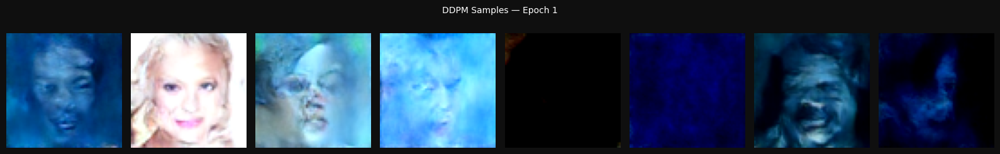

  Epoch 2 | Batch 50/469 | Loss: 0.0275
  Epoch 2 | Batch 100/469 | Loss: 0.0190
  Epoch 2 | Batch 150/469 | Loss: 0.0140
  Epoch 2 | Batch 200/469 | Loss: 0.0133
  Epoch 2 | Batch 250/469 | Loss: 0.0218
  Epoch 2 | Batch 300/469 | Loss: 0.0224
  Epoch 2 | Batch 350/469 | Loss: 0.0201
  Epoch 2 | Batch 400/469 | Loss: 0.0171
  Epoch 2 | Batch 450/469 | Loss: 0.0162

Epoch 2/30 | Avg Loss: 0.0199 | Time: 221s | LR: 0.000199


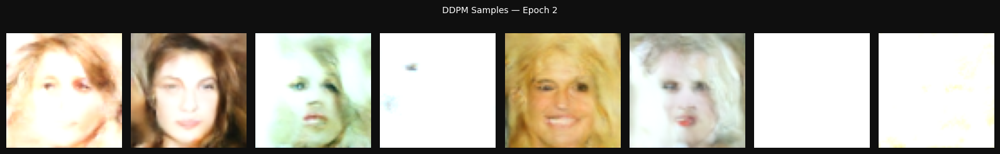

  Epoch 3 | Batch 50/469 | Loss: 0.0229
  Epoch 3 | Batch 100/469 | Loss: 0.0159
  Epoch 3 | Batch 150/469 | Loss: 0.0231
  Epoch 3 | Batch 200/469 | Loss: 0.0148
  Epoch 3 | Batch 250/469 | Loss: 0.0152
  Epoch 3 | Batch 300/469 | Loss: 0.0138
  Epoch 3 | Batch 350/469 | Loss: 0.0176
  Epoch 3 | Batch 400/469 | Loss: 0.0318
  Epoch 3 | Batch 450/469 | Loss: 0.0135

Epoch 3/30 | Avg Loss: 0.0190 | Time: 221s | LR: 0.000198


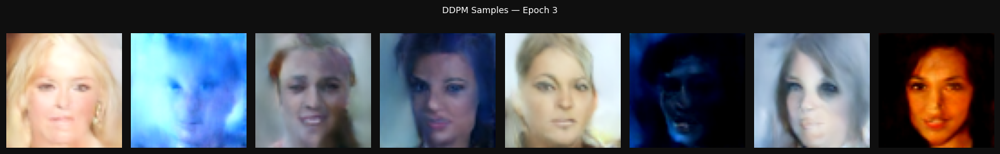

  Epoch 4 | Batch 50/469 | Loss: 0.0120
  Epoch 4 | Batch 100/469 | Loss: 0.0215
  Epoch 4 | Batch 150/469 | Loss: 0.0143
  Epoch 4 | Batch 200/469 | Loss: 0.0120
  Epoch 4 | Batch 250/469 | Loss: 0.0138
  Epoch 4 | Batch 300/469 | Loss: 0.0219
  Epoch 4 | Batch 350/469 | Loss: 0.0144
  Epoch 4 | Batch 400/469 | Loss: 0.0169
  Epoch 4 | Batch 450/469 | Loss: 0.0168

Epoch 4/30 | Avg Loss: 0.0190 | Time: 222s | LR: 0.000195


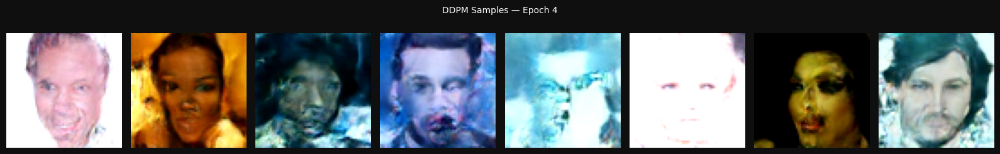

  Epoch 5 | Batch 50/469 | Loss: 0.0251
  Epoch 5 | Batch 100/469 | Loss: 0.0171
  Epoch 5 | Batch 150/469 | Loss: 0.0215
  Epoch 5 | Batch 200/469 | Loss: 0.0231
  Epoch 5 | Batch 250/469 | Loss: 0.0203
  Epoch 5 | Batch 300/469 | Loss: 0.0142
  Epoch 5 | Batch 350/469 | Loss: 0.0185
  Epoch 5 | Batch 400/469 | Loss: 0.0363
  Epoch 5 | Batch 450/469 | Loss: 0.0264

Epoch 5/30 | Avg Loss: 0.0191 | Time: 222s | LR: 0.000191


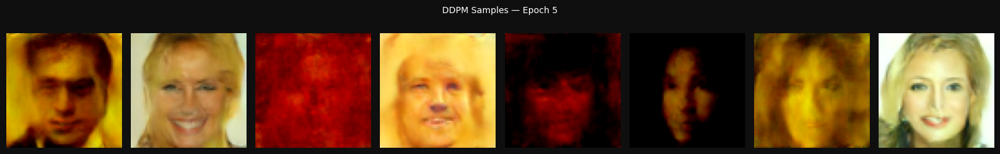

Checkpoint saved: ddpm_epoch_5.pth
  Epoch 6 | Batch 50/469 | Loss: 0.0202
  Epoch 6 | Batch 100/469 | Loss: 0.0189
  Epoch 6 | Batch 150/469 | Loss: 0.0157
  Epoch 6 | Batch 200/469 | Loss: 0.0233
  Epoch 6 | Batch 250/469 | Loss: 0.0215
  Epoch 6 | Batch 300/469 | Loss: 0.0153
  Epoch 6 | Batch 350/469 | Loss: 0.0200
  Epoch 6 | Batch 400/469 | Loss: 0.0122
  Epoch 6 | Batch 450/469 | Loss: 0.0140

Epoch 6/30 | Avg Loss: 0.0189 | Time: 222s | LR: 0.000187


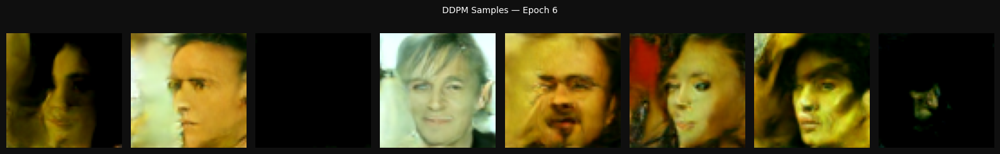

  Epoch 7 | Batch 50/469 | Loss: 0.0235
  Epoch 7 | Batch 100/469 | Loss: 0.0177
  Epoch 7 | Batch 150/469 | Loss: 0.0139
  Epoch 7 | Batch 200/469 | Loss: 0.0194
  Epoch 7 | Batch 250/469 | Loss: 0.0260
  Epoch 7 | Batch 300/469 | Loss: 0.0201
  Epoch 7 | Batch 350/469 | Loss: 0.0176
  Epoch 7 | Batch 400/469 | Loss: 0.0139
  Epoch 7 | Batch 450/469 | Loss: 0.0242

Epoch 7/30 | Avg Loss: 0.0183 | Time: 221s | LR: 0.000181


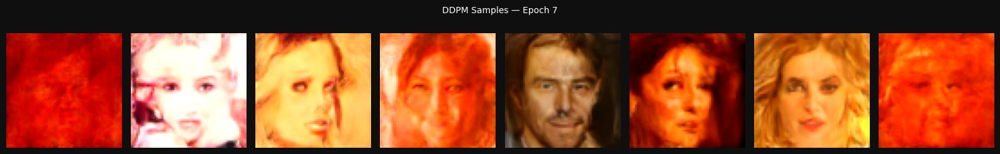

  Epoch 8 | Batch 50/469 | Loss: 0.0082
  Epoch 8 | Batch 100/469 | Loss: 0.0137
  Epoch 8 | Batch 150/469 | Loss: 0.0152
  Epoch 8 | Batch 200/469 | Loss: 0.0150
  Epoch 8 | Batch 250/469 | Loss: 0.0205
  Epoch 8 | Batch 300/469 | Loss: 0.0317
  Epoch 8 | Batch 350/469 | Loss: 0.0212
  Epoch 8 | Batch 400/469 | Loss: 0.0151
  Epoch 8 | Batch 450/469 | Loss: 0.0210

Epoch 8/30 | Avg Loss: 0.0182 | Time: 222s | LR: 0.000174


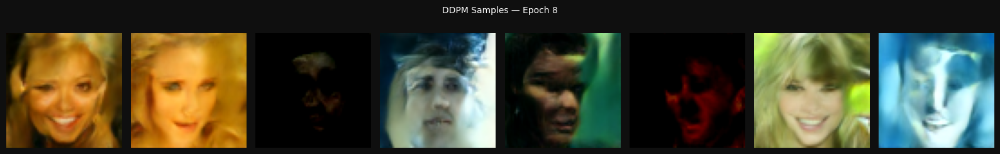

  Epoch 9 | Batch 50/469 | Loss: 0.0234
  Epoch 9 | Batch 100/469 | Loss: 0.0088
  Epoch 9 | Batch 150/469 | Loss: 0.0304
  Epoch 9 | Batch 200/469 | Loss: 0.0226
  Epoch 9 | Batch 250/469 | Loss: 0.0185
  Epoch 9 | Batch 300/469 | Loss: 0.0168
  Epoch 9 | Batch 350/469 | Loss: 0.0169
  Epoch 9 | Batch 400/469 | Loss: 0.0160
  Epoch 9 | Batch 450/469 | Loss: 0.0120

Epoch 9/30 | Avg Loss: 0.0187 | Time: 222s | LR: 0.000167


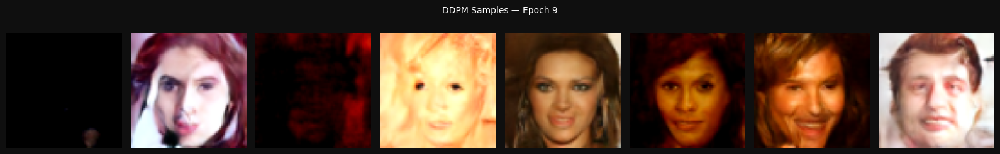

  Epoch 10 | Batch 50/469 | Loss: 0.0152
  Epoch 10 | Batch 100/469 | Loss: 0.0139
  Epoch 10 | Batch 150/469 | Loss: 0.0219
  Epoch 10 | Batch 200/469 | Loss: 0.0111
  Epoch 10 | Batch 250/469 | Loss: 0.0169
  Epoch 10 | Batch 300/469 | Loss: 0.0124
  Epoch 10 | Batch 350/469 | Loss: 0.0157
  Epoch 10 | Batch 400/469 | Loss: 0.0128
  Epoch 10 | Batch 450/469 | Loss: 0.0183

Epoch 10/30 | Avg Loss: 0.0176 | Time: 222s | LR: 0.000159


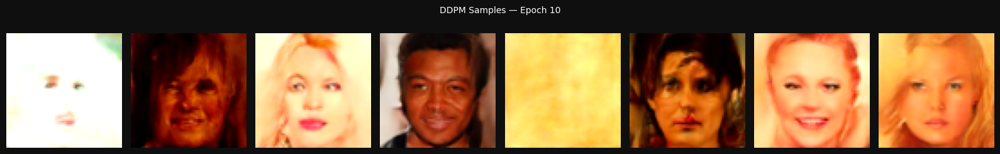

Checkpoint saved: ddpm_epoch_10.pth
  Epoch 11 | Batch 50/469 | Loss: 0.0123
  Epoch 11 | Batch 100/469 | Loss: 0.0265
  Epoch 11 | Batch 150/469 | Loss: 0.0207
  Epoch 11 | Batch 200/469 | Loss: 0.0148
  Epoch 11 | Batch 250/469 | Loss: 0.0324
  Epoch 11 | Batch 300/469 | Loss: 0.0128
  Epoch 11 | Batch 350/469 | Loss: 0.0251
  Epoch 11 | Batch 400/469 | Loss: 0.0176
  Epoch 11 | Batch 450/469 | Loss: 0.0106

Epoch 11/30 | Avg Loss: 0.0178 | Time: 222s | LR: 0.000150


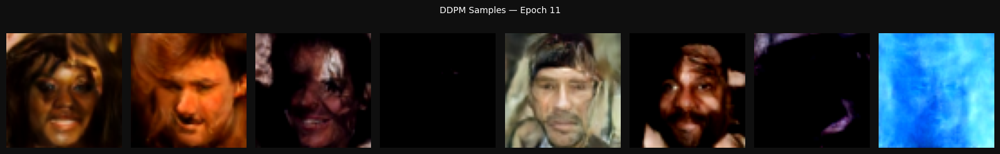

  Epoch 12 | Batch 50/469 | Loss: 0.0148
  Epoch 12 | Batch 100/469 | Loss: 0.0136
  Epoch 12 | Batch 150/469 | Loss: 0.0188
  Epoch 12 | Batch 200/469 | Loss: 0.0116
  Epoch 12 | Batch 250/469 | Loss: 0.0201
  Epoch 12 | Batch 300/469 | Loss: 0.0113
  Epoch 12 | Batch 350/469 | Loss: 0.0170
  Epoch 12 | Batch 400/469 | Loss: 0.0134
  Epoch 12 | Batch 450/469 | Loss: 0.0209

Epoch 12/30 | Avg Loss: 0.0178 | Time: 222s | LR: 0.000141


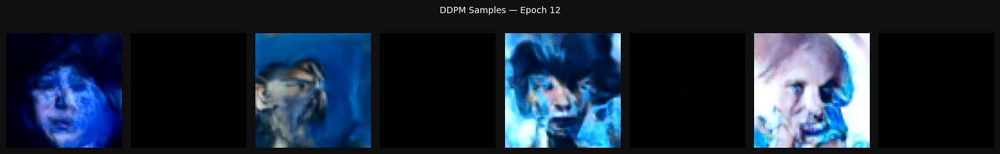

  Epoch 13 | Batch 50/469 | Loss: 0.0087
  Epoch 13 | Batch 100/469 | Loss: 0.0200
  Epoch 13 | Batch 150/469 | Loss: 0.0305
  Epoch 13 | Batch 200/469 | Loss: 0.0154
  Epoch 13 | Batch 250/469 | Loss: 0.0153
  Epoch 13 | Batch 300/469 | Loss: 0.0168
  Epoch 13 | Batch 350/469 | Loss: 0.0155
  Epoch 13 | Batch 400/469 | Loss: 0.0160
  Epoch 13 | Batch 450/469 | Loss: 0.0082

Epoch 13/30 | Avg Loss: 0.0177 | Time: 222s | LR: 0.000131


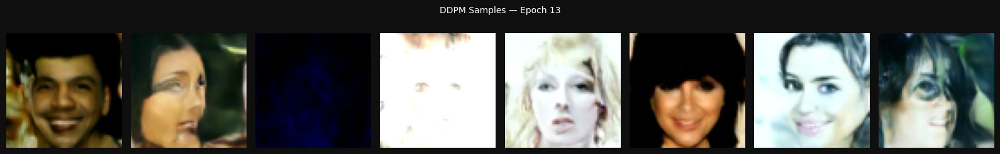

  Epoch 14 | Batch 50/469 | Loss: 0.0218
  Epoch 14 | Batch 100/469 | Loss: 0.0246
  Epoch 14 | Batch 150/469 | Loss: 0.0214
  Epoch 14 | Batch 200/469 | Loss: 0.0188
  Epoch 14 | Batch 250/469 | Loss: 0.0296
  Epoch 14 | Batch 300/469 | Loss: 0.0217
  Epoch 14 | Batch 350/469 | Loss: 0.0126
  Epoch 14 | Batch 400/469 | Loss: 0.0093
  Epoch 14 | Batch 450/469 | Loss: 0.0105

Epoch 14/30 | Avg Loss: 0.0173 | Time: 222s | LR: 0.000121


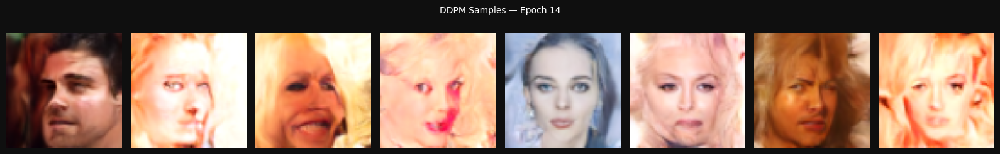

  Epoch 15 | Batch 50/469 | Loss: 0.0160
  Epoch 15 | Batch 100/469 | Loss: 0.0140
  Epoch 15 | Batch 150/469 | Loss: 0.0263
  Epoch 15 | Batch 200/469 | Loss: 0.0222
  Epoch 15 | Batch 250/469 | Loss: 0.0236
  Epoch 15 | Batch 300/469 | Loss: 0.0166
  Epoch 15 | Batch 350/469 | Loss: 0.0138
  Epoch 15 | Batch 400/469 | Loss: 0.0220
  Epoch 15 | Batch 450/469 | Loss: 0.0168

Epoch 15/30 | Avg Loss: 0.0177 | Time: 222s | LR: 0.000111


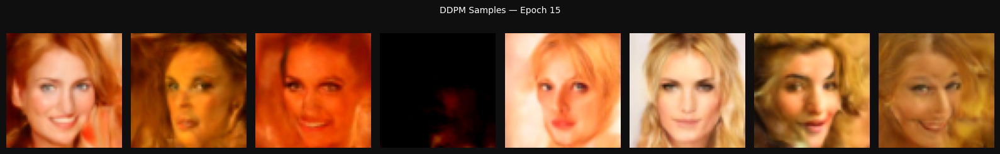

Checkpoint saved: ddpm_epoch_15.pth
  Epoch 16 | Batch 50/469 | Loss: 0.0371
  Epoch 16 | Batch 100/469 | Loss: 0.0161
  Epoch 16 | Batch 150/469 | Loss: 0.0154
  Epoch 16 | Batch 200/469 | Loss: 0.0116
  Epoch 16 | Batch 250/469 | Loss: 0.0228
  Epoch 16 | Batch 300/469 | Loss: 0.0182
  Epoch 16 | Batch 350/469 | Loss: 0.0106
  Epoch 16 | Batch 400/469 | Loss: 0.0097
  Epoch 16 | Batch 450/469 | Loss: 0.0111

Epoch 16/30 | Avg Loss: 0.0169 | Time: 222s | LR: 0.000101


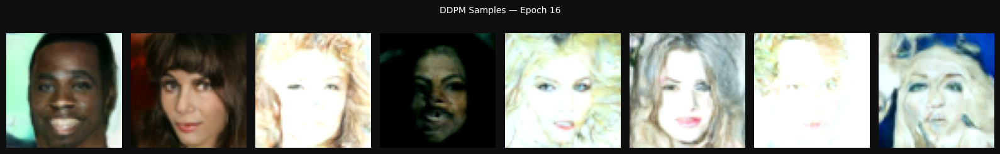

  Epoch 17 | Batch 50/469 | Loss: 0.0130
  Epoch 17 | Batch 100/469 | Loss: 0.0140
  Epoch 17 | Batch 150/469 | Loss: 0.0205
  Epoch 17 | Batch 200/469 | Loss: 0.0243
  Epoch 17 | Batch 250/469 | Loss: 0.0124
  Epoch 17 | Batch 300/469 | Loss: 0.0109
  Epoch 17 | Batch 350/469 | Loss: 0.0125
  Epoch 17 | Batch 400/469 | Loss: 0.0120
  Epoch 17 | Batch 450/469 | Loss: 0.0133

Epoch 17/30 | Avg Loss: 0.0169 | Time: 223s | LR: 0.000090


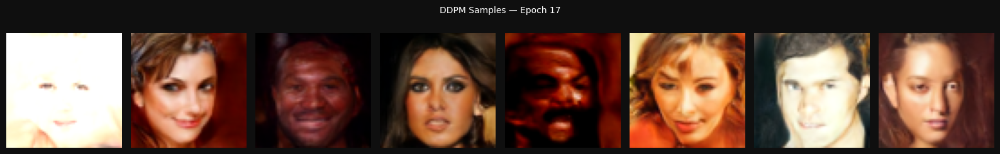

  Epoch 18 | Batch 50/469 | Loss: 0.0214
  Epoch 18 | Batch 100/469 | Loss: 0.0123
  Epoch 18 | Batch 150/469 | Loss: 0.0156
  Epoch 18 | Batch 200/469 | Loss: 0.0214
  Epoch 18 | Batch 250/469 | Loss: 0.0119
  Epoch 18 | Batch 300/469 | Loss: 0.0202
  Epoch 18 | Batch 350/469 | Loss: 0.0329
  Epoch 18 | Batch 400/469 | Loss: 0.0133
  Epoch 18 | Batch 450/469 | Loss: 0.0118

Epoch 18/30 | Avg Loss: 0.0174 | Time: 222s | LR: 0.000080


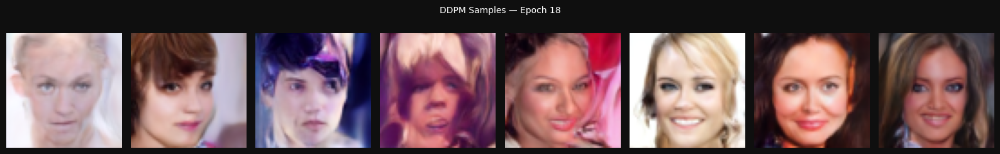

  Epoch 19 | Batch 50/469 | Loss: 0.0122
  Epoch 19 | Batch 100/469 | Loss: 0.0153
  Epoch 19 | Batch 150/469 | Loss: 0.0099
  Epoch 19 | Batch 200/469 | Loss: 0.0102
  Epoch 19 | Batch 250/469 | Loss: 0.0374
  Epoch 19 | Batch 300/469 | Loss: 0.0083
  Epoch 19 | Batch 350/469 | Loss: 0.0123
  Epoch 19 | Batch 400/469 | Loss: 0.0176
  Epoch 19 | Batch 450/469 | Loss: 0.0087

Epoch 19/30 | Avg Loss: 0.0168 | Time: 222s | LR: 0.000070


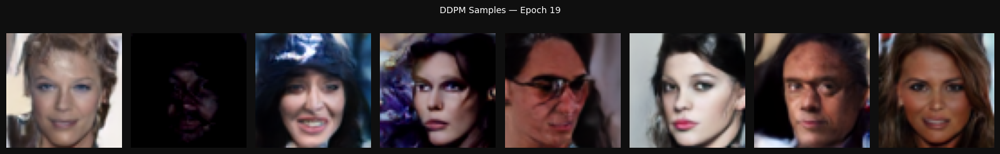

  Epoch 20 | Batch 50/469 | Loss: 0.0291
  Epoch 20 | Batch 100/469 | Loss: 0.0307
  Epoch 20 | Batch 150/469 | Loss: 0.0158
  Epoch 20 | Batch 200/469 | Loss: 0.0200
  Epoch 20 | Batch 250/469 | Loss: 0.0132
  Epoch 20 | Batch 300/469 | Loss: 0.0201
  Epoch 20 | Batch 350/469 | Loss: 0.0216
  Epoch 20 | Batch 400/469 | Loss: 0.0090
  Epoch 20 | Batch 450/469 | Loss: 0.0144

Epoch 20/30 | Avg Loss: 0.0169 | Time: 222s | LR: 0.000060


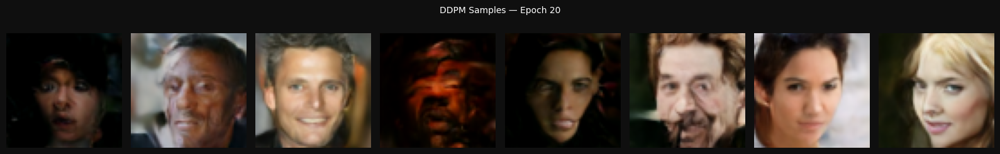

Checkpoint saved: ddpm_epoch_20.pth
  Epoch 21 | Batch 50/469 | Loss: 0.0129
  Epoch 21 | Batch 100/469 | Loss: 0.0205
  Epoch 21 | Batch 150/469 | Loss: 0.0140
  Epoch 21 | Batch 200/469 | Loss: 0.0112
  Epoch 21 | Batch 250/469 | Loss: 0.0156
  Epoch 21 | Batch 300/469 | Loss: 0.0136
  Epoch 21 | Batch 350/469 | Loss: 0.0216
  Epoch 21 | Batch 400/469 | Loss: 0.0111
  Epoch 21 | Batch 450/469 | Loss: 0.0112

Epoch 21/30 | Avg Loss: 0.0167 | Time: 223s | LR: 0.000051


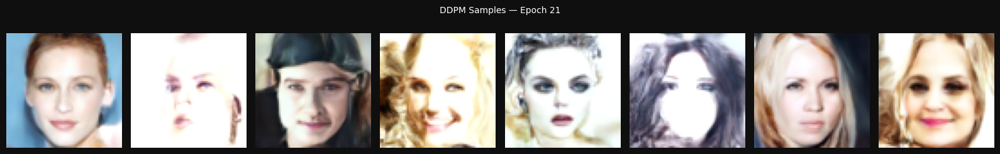

  Epoch 22 | Batch 50/469 | Loss: 0.0103
  Epoch 22 | Batch 100/469 | Loss: 0.0154
  Epoch 22 | Batch 150/469 | Loss: 0.0184
  Epoch 22 | Batch 200/469 | Loss: 0.0209
  Epoch 22 | Batch 250/469 | Loss: 0.0233
  Epoch 22 | Batch 300/469 | Loss: 0.0086
  Epoch 22 | Batch 350/469 | Loss: 0.0192
  Epoch 22 | Batch 400/469 | Loss: 0.0266
  Epoch 22 | Batch 450/469 | Loss: 0.0056

Epoch 22/30 | Avg Loss: 0.0168 | Time: 223s | LR: 0.000042


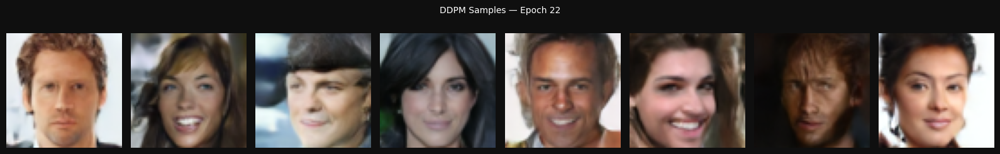

  Epoch 23 | Batch 50/469 | Loss: 0.0155
  Epoch 23 | Batch 100/469 | Loss: 0.0138
  Epoch 23 | Batch 150/469 | Loss: 0.0119
  Epoch 23 | Batch 200/469 | Loss: 0.0180
  Epoch 23 | Batch 250/469 | Loss: 0.0103
  Epoch 23 | Batch 300/469 | Loss: 0.0120
  Epoch 23 | Batch 350/469 | Loss: 0.0129
  Epoch 23 | Batch 400/469 | Loss: 0.0123
  Epoch 23 | Batch 450/469 | Loss: 0.0118

Epoch 23/30 | Avg Loss: 0.0172 | Time: 222s | LR: 0.000034


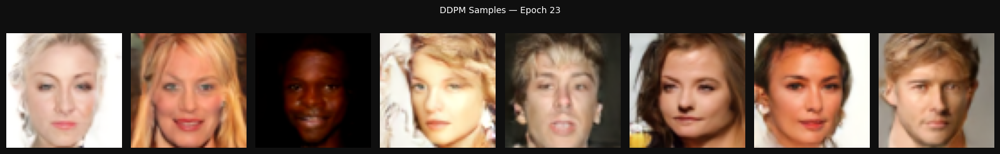

  Epoch 24 | Batch 50/469 | Loss: 0.0302
  Epoch 24 | Batch 100/469 | Loss: 0.0207
  Epoch 24 | Batch 150/469 | Loss: 0.0216
  Epoch 24 | Batch 200/469 | Loss: 0.0161
  Epoch 24 | Batch 250/469 | Loss: 0.0138
  Epoch 24 | Batch 300/469 | Loss: 0.0211
  Epoch 24 | Batch 350/469 | Loss: 0.0193
  Epoch 24 | Batch 400/469 | Loss: 0.0200
  Epoch 24 | Batch 450/469 | Loss: 0.0108

Epoch 24/30 | Avg Loss: 0.0166 | Time: 223s | LR: 0.000027


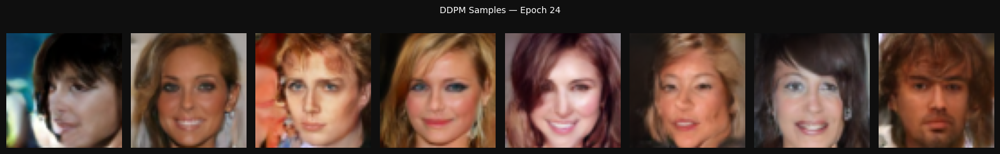

  Epoch 25 | Batch 50/469 | Loss: 0.0147
  Epoch 25 | Batch 100/469 | Loss: 0.0104
  Epoch 25 | Batch 150/469 | Loss: 0.0361
  Epoch 25 | Batch 200/469 | Loss: 0.0187
  Epoch 25 | Batch 250/469 | Loss: 0.0191
  Epoch 25 | Batch 300/469 | Loss: 0.0211
  Epoch 25 | Batch 350/469 | Loss: 0.0183
  Epoch 25 | Batch 400/469 | Loss: 0.0125
  Epoch 25 | Batch 450/469 | Loss: 0.0139

Epoch 25/30 | Avg Loss: 0.0164 | Time: 223s | LR: 0.000020


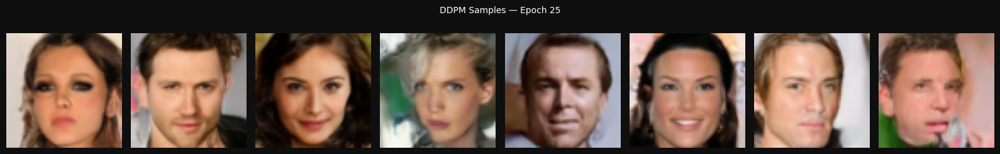

Checkpoint saved: ddpm_epoch_25.pth
  Epoch 26 | Batch 50/469 | Loss: 0.0147
  Epoch 26 | Batch 100/469 | Loss: 0.0290
  Epoch 26 | Batch 150/469 | Loss: 0.0191
  Epoch 26 | Batch 200/469 | Loss: 0.0178
  Epoch 26 | Batch 250/469 | Loss: 0.0277
  Epoch 26 | Batch 300/469 | Loss: 0.0299
  Epoch 26 | Batch 350/469 | Loss: 0.0107
  Epoch 26 | Batch 400/469 | Loss: 0.0227
  Epoch 26 | Batch 450/469 | Loss: 0.0340

Epoch 26/30 | Avg Loss: 0.0162 | Time: 223s | LR: 0.000014


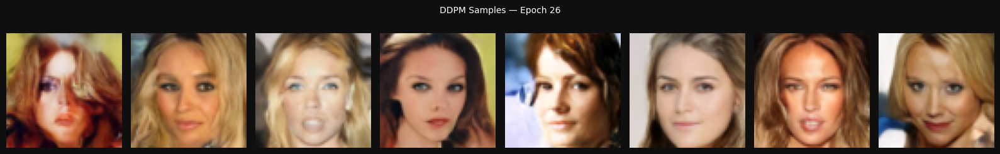

  Epoch 27 | Batch 50/469 | Loss: 0.0085
  Epoch 27 | Batch 100/469 | Loss: 0.0103
  Epoch 27 | Batch 150/469 | Loss: 0.0214
  Epoch 27 | Batch 200/469 | Loss: 0.0216
  Epoch 27 | Batch 250/469 | Loss: 0.0157
  Epoch 27 | Batch 300/469 | Loss: 0.0218
  Epoch 27 | Batch 350/469 | Loss: 0.0188
  Epoch 27 | Batch 400/469 | Loss: 0.0166
  Epoch 27 | Batch 450/469 | Loss: 0.0195

Epoch 27/30 | Avg Loss: 0.0160 | Time: 222s | LR: 0.000010


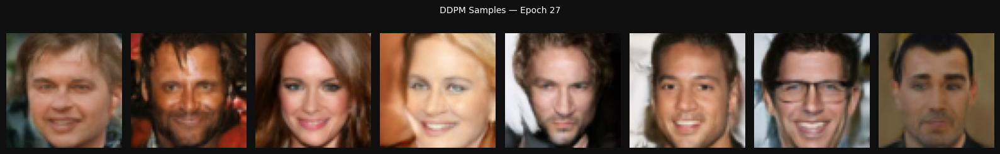

  Epoch 28 | Batch 50/469 | Loss: 0.0195
  Epoch 28 | Batch 100/469 | Loss: 0.0092
  Epoch 28 | Batch 150/469 | Loss: 0.0211
  Epoch 28 | Batch 200/469 | Loss: 0.0195
  Epoch 28 | Batch 250/469 | Loss: 0.0151
  Epoch 28 | Batch 300/469 | Loss: 0.0093
  Epoch 28 | Batch 350/469 | Loss: 0.0210
  Epoch 28 | Batch 400/469 | Loss: 0.0089
  Epoch 28 | Batch 450/469 | Loss: 0.0108

Epoch 28/30 | Avg Loss: 0.0162 | Time: 223s | LR: 0.000006


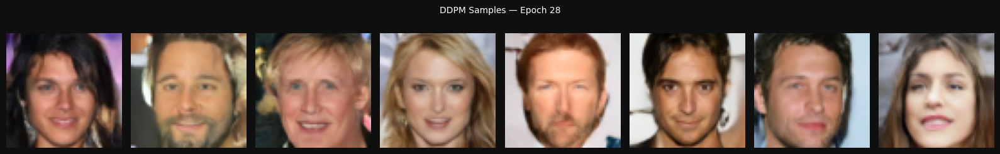

  Epoch 29 | Batch 50/469 | Loss: 0.0180
  Epoch 29 | Batch 100/469 | Loss: 0.0196
  Epoch 29 | Batch 150/469 | Loss: 0.0201
  Epoch 29 | Batch 200/469 | Loss: 0.0146
  Epoch 29 | Batch 250/469 | Loss: 0.0152
  Epoch 29 | Batch 300/469 | Loss: 0.0158
  Epoch 29 | Batch 350/469 | Loss: 0.0287
  Epoch 29 | Batch 400/469 | Loss: 0.0205
  Epoch 29 | Batch 450/469 | Loss: 0.0177

Epoch 29/30 | Avg Loss: 0.0161 | Time: 223s | LR: 0.000003


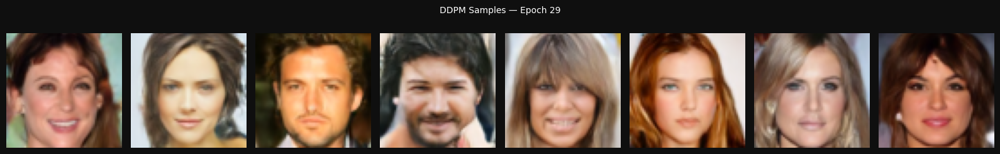

  Epoch 30 | Batch 50/469 | Loss: 0.0152
  Epoch 30 | Batch 100/469 | Loss: 0.0138
  Epoch 30 | Batch 150/469 | Loss: 0.0104
  Epoch 30 | Batch 200/469 | Loss: 0.0166
  Epoch 30 | Batch 250/469 | Loss: 0.0107
  Epoch 30 | Batch 300/469 | Loss: 0.0179
  Epoch 30 | Batch 350/469 | Loss: 0.0104
  Epoch 30 | Batch 400/469 | Loss: 0.0139
  Epoch 30 | Batch 450/469 | Loss: 0.0187

Epoch 30/30 | Avg Loss: 0.0166 | Time: 223s | LR: 0.000002


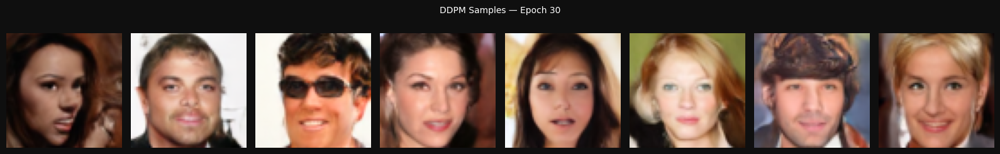

Checkpoint saved: ddpm_epoch_30.pth

DDPM Training Complete!


In [12]:
import torch
import torch.nn as nn
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR
import matplotlib.pyplot as plt
import time
import os

# ── Config ───────────────────────────────────────────────────────
EPOCHS    = 30
LR        = 2e-4
LOG_EVERY = 50
IMG_SIZE  = 64
N_SAMPLES = 8

os.makedirs('/kaggle/working/checkpoints', exist_ok=True)
os.makedirs('/kaggle/working/samples',     exist_ok=True)

optimizer = AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
scheduler = CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-6)

history   = {'loss': [], 'lr': []}

def save_samples(model, ddpm, epoch, device, n=8):
    """Generate and save sample images."""
    raw_model = model.module if hasattr(model, 'module') else model
    imgs = ddpm.sample(raw_model, n_samples=n, img_size=IMG_SIZE)
    imgs = (imgs * 0.5 + 0.5).clamp(0, 1).cpu()

    fig, axes = plt.subplots(1, n, figsize=(16, 2.5))
    fig.patch.set_facecolor('#0f0f0f')
    for i, ax in enumerate(axes):
        ax.imshow(imgs[i].permute(1,2,0).numpy())
        ax.axis('off')
    plt.suptitle(f'DDPM Samples — Epoch {epoch}', color='white', fontsize=10)
    plt.tight_layout()
    plt.savefig(f'/kaggle/working/samples/epoch_{epoch:03d}.png',
                dpi=100, bbox_inches='tight', facecolor='#0f0f0f')
    plt.show()
    plt.close()
    model.train()

# ── Training loop ────────────────────────────────────────────────
print(f"Training DDPM | {EPOCHS} epochs | LR={LR} | Device={device}\n")

for epoch in range(1, EPOCHS + 1):
    model.train()
    epoch_loss = 0.0
    t0 = time.time()

    for batch_idx, imgs in enumerate(dataloader):
        imgs = imgs.to(device)
        t    = torch.randint(0, ddpm.T, (imgs.size(0),), device=device)

        optimizer.zero_grad()
        loss = ddpm.p_loss(model, imgs, t)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()

        epoch_loss += loss.item()

        if (batch_idx + 1) % LOG_EVERY == 0:
            print(f"  Epoch {epoch} | Batch {batch_idx+1}/{len(dataloader)}"
                  f" | Loss: {loss.item():.4f}")

    avg_loss = epoch_loss / len(dataloader)
    elapsed  = time.time() - t0
    lr_now   = scheduler.get_last_lr()[0]
    scheduler.step()

    history['loss'].append(avg_loss)
    history['lr'].append(lr_now)

    print(f"\nEpoch {epoch}/{EPOCHS} | Avg Loss: {avg_loss:.4f}"
          f" | Time: {elapsed:.0f}s | LR: {lr_now:.6f}")

    # Save samples every epoch
    save_samples(model, ddpm, epoch, device, n=N_SAMPLES)

    # Save checkpoint every 5 epochs
    if epoch % 5 == 0:
        raw = model.module if hasattr(model, 'module') else model
        torch.save(raw.state_dict(),
            f'/kaggle/working/checkpoints/ddpm_epoch_{epoch}.pth')
        print(f"Checkpoint saved: ddpm_epoch_{epoch}.pth")
        

print("\nDDPM Training Complete!")

## Part 2: DDIM — Fast Sampling (Song et al. 2020)

**Problem with DDPM sampling:** Generating one image requires 1000 sequential UNet 
forward passes. On a GPU this takes ~30-60 seconds per image.

**DDIM fix:** Skip timesteps deterministically. Instead of t=999,998,997...
jump t=999,950,900,850... using only 50 steps. Same trained model, no retraining needed.

**Key insight:** DDPM sampling is stochastic (adds random noise each step).
DDIM makes it deterministic by setting σ=0 — the trajectory is fixed given x_T.
This also enables latent space interpolation between generated images.

**Speedup: 20x faster** (50 steps vs 1000 steps) with comparable quality.

Generating 4 samples with DDPM (1000 steps)...
DDPM time : 25.6s

Generating 4 samples with DDIM (50 steps)...
DDIM time : 1.3s
Speedup   : 20.1x faster


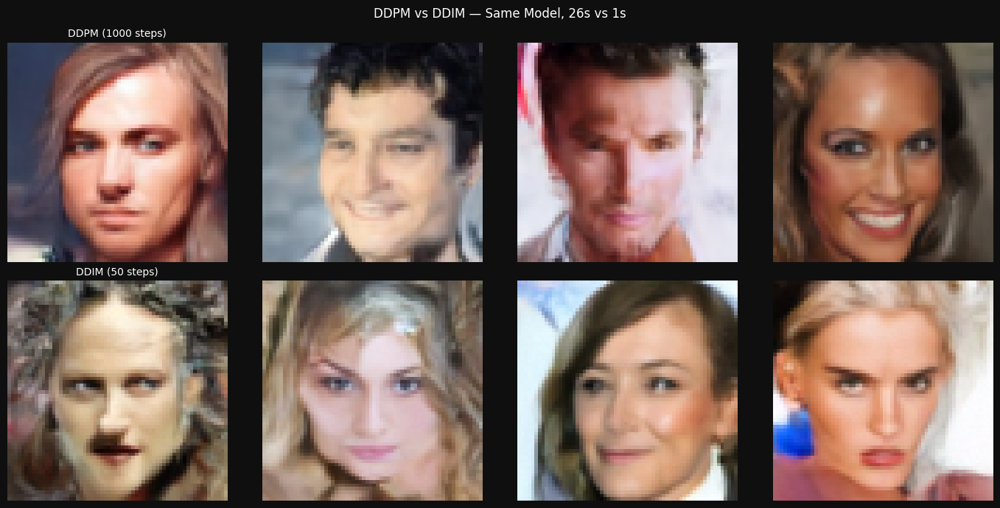


DDIM latent interpolation (same noise seed, eta=0)...


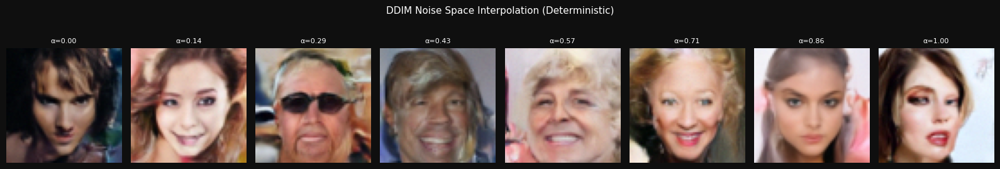

In [13]:
import torch
import matplotlib.pyplot as plt
import time
import numpy as np

@torch.no_grad()
def ddim_sample(model, ddpm, n_samples=8, img_size=64,
                ddim_steps=50, eta=0.0):
    """
    DDIM sampling — skip timesteps for fast generation.
    eta=0.0 → fully deterministic
    eta=1.0 → equivalent to DDPM
    """
    model.eval()
    device = ddpm.device

    # Choose subset of timesteps evenly spaced
    step_size  = ddpm.T // ddim_steps
    timesteps  = list(reversed(range(0, ddpm.T, step_size)))  # [999,949,...]

    x = torch.randn(n_samples, 3, img_size, img_size).to(device)

    for i, t_val in enumerate(timesteps):
        t      = torch.full((n_samples,), t_val, device=device, dtype=torch.long)
        t_prev = torch.full((n_samples,),
                            timesteps[i+1] if i+1 < len(timesteps) else 0,
                            device=device, dtype=torch.long)

        ab_t      = ddpm.alpha_bars[t].view(-1,1,1,1)
        ab_t_prev = ddpm.alpha_bars[t_prev].view(-1,1,1,1)

        # Predict noise
        eps_pred  = model(x, t)

        # Predict x0
        x0_pred   = (x - (1 - ab_t).sqrt() * eps_pred) / ab_t.sqrt()
        x0_pred   = x0_pred.clamp(-1, 1)

        # DDIM update step
        sigma     = eta * ((1 - ab_t_prev) / (1 - ab_t)).sqrt() * \
                    (1 - ab_t / ab_t_prev).sqrt()
        dir_xt    = (1 - ab_t_prev - sigma**2).sqrt() * eps_pred
        noise     = torch.randn_like(x) if eta > 0 else 0
        x         = ab_t_prev.sqrt() * x0_pred + dir_xt + sigma * noise

    return x


# ── Get the raw model ─────────────────────────────────────────────
raw_model = model.module if hasattr(model, 'module') else model
raw_model.eval()

# ── Compare DDPM vs DDIM speed ────────────────────────────────────
print("Generating 4 samples with DDPM (1000 steps)...")
t0   = time.time()
ddpm_imgs = ddpm.sample(raw_model, n_samples=4, img_size=64)
ddpm_time = time.time() - t0
print(f"DDPM time : {ddpm_time:.1f}s")

print("\nGenerating 4 samples with DDIM (50 steps)...")
t0   = time.time()
ddim_imgs = ddim_sample(raw_model, ddpm, n_samples=4,
                         img_size=64, ddim_steps=50, eta=0.0)
ddim_time = time.time() - t0
print(f"DDIM time : {ddim_time:.1f}s")
print(f"Speedup   : {ddpm_time/ddim_time:.1f}x faster")

# ── Visual comparison ─────────────────────────────────────────────
fig, axes = plt.subplots(2, 4, figsize=(14, 7))
fig.patch.set_facecolor('#0f0f0f')

titles = ['DDPM (1000 steps)', 'DDIM (50 steps)']
for row, (imgs, title) in enumerate(zip([ddpm_imgs, ddim_imgs], titles)):
    imgs = (imgs * 0.5 + 0.5).clamp(0,1).cpu()
    for col in range(4):
        axes[row, col].imshow(imgs[col].permute(1,2,0).numpy())
        axes[row, col].axis('off')
        if col == 0:
            axes[row, col].set_title(title, color='white',
                fontsize=10, pad=6)

plt.suptitle(f'DDPM vs DDIM — Same Model, {ddpm_time:.0f}s vs {ddim_time:.0f}s',
    color='white', fontsize=12)
plt.tight_layout()
plt.savefig('ddpm_vs_ddim.png', dpi=130,
    bbox_inches='tight', facecolor='#0f0f0f')
plt.show()

# ── DDIM Deterministic interpolation ──────────────────────────────
print("\nDDIM latent interpolation (same noise seed, eta=0)...")
torch.manual_seed(42)
zA = torch.randn(1, 3, 64, 64).to(device)
torch.manual_seed(99)
zB = torch.randn(1, 3, 64, 64).to(device)

fig, axes = plt.subplots(1, 8, figsize=(16, 3))
fig.patch.set_facecolor('#0f0f0f')

for i, alpha in enumerate(np.linspace(0, 1, 8)):
    z_interp = (1 - alpha) * zA + alpha * zB
    with torch.no_grad():
        img = ddim_sample(raw_model, ddpm, n_samples=1,
                          img_size=64, ddim_steps=50, eta=0.0)
    img = (img * 0.5 + 0.5).clamp(0,1).cpu()
    axes[i].imshow(img[0].permute(1,2,0).numpy())
    axes[i].axis('off')
    axes[i].set_title(f'α={alpha:.2f}', color='white', fontsize=8)

plt.suptitle('DDIM Noise Space Interpolation (Deterministic)',
    color='white', fontsize=11)
plt.tight_layout()
plt.savefig('ddim_interpolation.png', dpi=130,
    bbox_inches='tight', facecolor='#0f0f0f')
plt.show()